# Paired Token Prediction

## Disclaimer

First, a quick disclaimer. This publication is an experiment aimed to reduce publication burden at Arcadia Science by strongly coupling our exploratory analyses with our publishable results. Essentially, we're experimenting with getting out small, digestable publications that are informal, approachable, exploratory, and that intertwine code and figures with prose. We're entertaining this idea because within our teams, we often internally share results in the form of Jupyter notebooks and our thought is that with just a little more lift, these could be publishable externally.

We're hopeful this approach closes two key gaps:

1. It addresses the common disconnect between publications and their underlying code/data. Since what you're reading is rendered directly from [this codebase](https://github.com/Arcadia-Science/2024-paired-token-masking), reproducibility is an inherent feature of this publication.

2. It aims to reduce the delay between conducting our research and receiving community feedback, which we believe is a more efficient way to advance scientific discourse.

With that in mind, you can consider this our first experiment in this domain. If you have feedback or things you liked or didn't like, please share your opinions.

## Intro

This blog/notebook/pub details a quick analysis we performed on the ESM2 (Evolutionary Scale Modeling) model for masked token prediction. We stumbled upon a counter-intuitive result related to the effect that masking one residue has on the distribution of another.

When performing masked token prediction, there is a kind of tradeoff between efficiency and information utilization. On one extreme, if you unmask all masked tokens simultaneously then you only need to do a single forward pass, which would be very computationally efficient. However, this approach prevents the model from leveraging the information gained from each newly unmasked position to inform subsequent predictions. At the other end of the spectrum, unmasking tokens one at a time allows for maximum information utilization but can be really expensive in terms of computational resources. There is also a concern that by unmasking individually, you only make conservative choices that prevent a deeper exploration of sequence space. All this is to say that developing effective decoding strategies is an important concern for maximizes the utility of these masked-token prediction models.

With this in mind, we thought it made sense to try and gain some insight into how masking at one position affects the outcome at another masked position. Basically, the thought is to mask two locations, both individually and jointly, and quantify any changes in their predicted amino acid probabilities. By doing this repeatedly for each pair of residues in the sequence, will we start to capture interdependencies between the sequence positions? Do these statistical dependencies relate back to things we expect, like the attention map of the model, or perhaps the contact map of the amino acids in 3D space? Are there any interpretable patterns at all?

## Primer on Masked Token Prediction

The procedure roughly speaking goes like this. An incomplete sequence is passed through the model. It's incomplete because at one or more residues, a masked token is placed in lieu of an amino acid. The collection of masked positions is denoted as $M$ and the partially masked sequence is denoted as $S_{-M}$. Here's an example:

$$
S_{-M} = \text{A R <mask> A D I <mask>}
$$

Here, $M = \lbrace 2, 6 \rbrace$, which is $0$-indexed because Python has corrupted our minds. When this sequence is passed through an ESM model with an attached language-modelling head, the output is an array of unnormalized confidence levels for each amino acid at the masked positions. We call these values _logits_, which can be readily converted into an amino acid probability distribution for each masked residue. We denote these amino acid probability distribution of the $i$th residue as $p(i|M)$, where $i \in M$.

So that's how to generate an amino acid probability distribution prediction for a masked residue. In this analysis, we want to see how the predicted distribution for a masked residue differs when a second residue is also masked. We'll do this by considering a pair of positions $i$ and $j$ and asking the following questions:

1. How does $p(i | \lbrace i \rbrace)$ compare with $p(i | \lbrace i, j \rbrace)$?
2. How does $p(j | \lbrace j \rbrace)$ compare with $p(j | \lbrace i, j \rbrace)$?

We will assess the similarity of these distributions with Jensen-Shannon entropy.

## Loading the model

It's time to get to work and a good place to start is a quick survey of the available ESM2 model sizes. The ESM2 architecture was created and trained for 6 different model sizes, which are described here:

In [1]:
class ModelName:
    M8: str = "facebook/esm2_t6_8M_UR50D"
    M35: str = "facebook/esm2_t12_35M_UR50D"
    M150: str = "facebook/esm2_t30_150M_UR50D"
    M650: str = "facebook/esm2_t33_650M_UR50D"
    M3000: str = "facebook/esm2_t36_3B_UR50D"
    M15000: str = "facebook/esm2_t48_15B_UR50D"

    @classmethod
    def all(cls) -> list[str]:
        return [getattr(cls, name) for name in cls.__annotations__]

All of these models are hosted on [HuggingFace](https://huggingface.co/docs/transformers/en/model_doc/esm) and can be loaded using the `transformers` python package.

The larger models need GPUs to run. We'll do that later. For now, let's load up the smallest model for prototyping the analysis.

In [2]:
from transformers import EsmForMaskedLM

model = EsmForMaskedLM.from_pretrained(ModelName.M8)
model

/opt/miniconda3/envs/paired-token-masking/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


EsmForMaskedLM(
  (esm): EsmModel(
    (embeddings): EsmEmbeddings(
      (word_embeddings): Embedding(33, 320, padding_idx=1)
      (dropout): Dropout(p=0.0, inplace=False)
      (position_embeddings): Embedding(1026, 320, padding_idx=1)
    )
    (encoder): EsmEncoder(
      (layer): ModuleList(
        (0-5): 6 x EsmLayer(
          (attention): EsmAttention(
            (self): EsmSelfAttention(
              (query): Linear(in_features=320, out_features=320, bias=True)
              (key): Linear(in_features=320, out_features=320, bias=True)
              (value): Linear(in_features=320, out_features=320, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
              (rotary_embeddings): RotaryEmbedding()
            )
            (output): EsmSelfOutput(
              (dense): Linear(in_features=320, out_features=320, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (LayerNorm): LayerNorm((320,), eps=1e-05, elementwise_a

In addition to the base ESM architecture, this model has an attached language-model decoder head, which you can see at the bottom of the printed model architecture. It is this part of the model that converts the latent embedding produced by the model into the logits array which we will then transform into amino acid probability distributions.

## Getting the probability array $P$

A forward pass of `model` yields the array $P$ described above--well, almost. It actually outputs a logits array, which we can transform into $P$ relatively easily.

To convert the logits to probabilities, we'll need to apply a [softmax](https://en.wikipedia.org/wiki/Softmax_function). Before doing that, we'll want to exclude some tokens (like start-of-sequence, end-of-sequence, and non-canonical amino acids B, X, U, etc), since we don't want them in our probability space. Let's do that by loading up the tokenzier and figuring out which amino acids belong to which token IDs.

In [3]:
from transformers import AutoTokenizer

tokenizer = AutoTokenizer.from_pretrained(ModelName.M8, clean_up_tokenization_spaces=True)
all_tokens = tokenizer.all_tokens
print(f"There are {len(all_tokens)} tokens in the tokenizer's vocabulary: {all_tokens}")

There are 33 tokens in the tokenizer's vocabulary: ['<cls>', '<pad>', '<eos>', '<unk>', 'L', 'A', 'G', 'V', 'S', 'E', 'R', 'T', 'I', 'D', 'P', 'K', 'Q', 'N', 'F', 'Y', 'M', 'H', 'W', 'C', 'X', 'B', 'U', 'Z', 'O', '.', '-', '<null_1>', '<mask>']


As expected, some of these tokens aren't amino acids. So when we do a forward pass through the model, we're going to end up with logits values for all the non-amino acids as well. Let's verify this by passing some false data through the head of the model:

In [4]:
import torch

seq_len = 100
hidden_features = model.lm_head.dense.in_features
base_model_output = torch.rand((seq_len, hidden_features), device=model.device)

logits = model.lm_head(base_model_output)

print(f"Shape of logits array: {logits.shape}")
assert logits.shape[1] == len(all_tokens)

Shape of logits array: torch.Size([100, 33])


Yep, there are logits values for all 33 tokens. If we included them in our softmax calculation, all these tokens would be part of our probability space. So let's define the canonical amino acids--the one's we care about--and filter out all the rest.

In [5]:
amino_acids = sorted(
    [
        "A",
        "C",
        "D",
        "E",
        "F",
        "G",
        "H",
        "I",
        "K",
        "L",
        "M",
        "N",
        "P",
        "Q",
        "R",
        "S",
        "T",
        "V",
        "W",
        "Y",
    ]
)
aa_token_indices = tokenizer.convert_tokens_to_ids(amino_acids)
assert [tokenizer.all_tokens[i] for i in aa_token_indices] == amino_acids

logits_aas = logits[:, aa_token_indices]
logits_aas.shape

torch.Size([100, 20])

Perfect, now after applying a softmax, we have an array of probability mass functions. Let's do that, and verify that all columns sum to 1.

In [6]:
from torch.nn.functional import softmax

with torch.no_grad():
    probs = softmax(logits_aas, dim=-1)

probs.sum(axis=1)

tensor([1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000])

You can index `probs` to determine the probability of sampling an amino acid at a given residue. For example, the probability of observing tryptophan at residue position 10 for our fake data is:

In [7]:
probs[10, amino_acids.index("W")].item()

0.004420164041221142

To save us the future effort, let's write a function that calculates an amino acid probability array when handed the raw logits:

In [8]:
def get_probs_array(logits):
    return softmax(torch.tensor(logits)[..., aa_token_indices], dim=-1).numpy()

## Sequence of interest

It's about time we stopped working with fake data. Let's load up an example protein, [adenosine deaminase (human)](https://www.uniprot.org/uniprotkb/P00813/entry).

In [9]:
from pathlib import Path

from biotite.sequence.io.fasta import FastaFile

sequence_path = Path("input/P00813.fasta")
sequence = FastaFile().read(sequence_path)["P00813"]
print(f"{sequence=}")
print(f"{len(sequence)=}")

sequence='MAQTPAFDKPKVELHVHLDGSIKPETILYYGRRRGIALPANTAEGLLNVIGMDKPLTLPDFLAKFDYYMPAIAGCREAIKRIAYEFVEMKAKEGVVYVEVRYSPHLLANSKVEPIPWNQAEGDLTPDEVVALVGQGLQEGERDFGVKARSILCCMRHQPNWSPKVVELCKKYQQQTVVAIDLAGDETIPGSSLLPGHVQAYQEAVKSGIHRTVHAGEVGSAEVVKEAVDILKTERLGHGYHTLEDQALYNRLRQENMHFEICPWSSYLTGAWKPDTEHAVIRLKNDQANYSLNTDDPLIFKSTLDTDYQMTKRDMGFTEEEFKRLNINAAKSSFLPEDEKRELLDLLYKAYGMPPSASAGQNL'
len(sequence)=363


## Creating the mask libraries

We now know how to turn the model output, a logits array, into an array of amino acid probability masses. Now we

, The goal is to compare the amino acid probability distributions for single- versus double-residue masking. We'll do this exhaustively for our sequence of interest, so we establish 2 different libraries: the single masks, of which there are $N$ and the double masks, of which there are $N \choose 2$.

In [10]:
from itertools import combinations

N = len(sequence)
single_masks = list(combinations(range(N), 1))
double_masks = list(combinations(range(N), 2))

print(f"{single_masks[:5]=}")
print(f"{double_masks[:5]=}")

assert len(single_masks) == N
assert len(double_masks) == N * (N - 1) / 2

single_masks[:5]=[(0,), (1,), (2,), (3,), (4,)]
double_masks[:5]=[(0, 1), (0, 2), (0, 3), (0, 4), (0, 5)]


## Calculating all the logits

The smallest ESM2 models can be ran locally on CPU, but since we're interested in doing a scan over the whole model suite, we'll have to graduate to GPUs eventually. Let's make that jump now.

We've deployed a [Modal](https://modal.com/) app for masked prediction, which can be found in the source code that generated this pub.

Let's load up the prediction function we'll be using along with the workload specifications for each model size. The larger models require more GPU memory and through trial and error we've satisfied this constraint by choosing increasingly powerful GPUs and decreasing the batch size.

In [11]:
import modal

predict = modal.Function.lookup("esm-masked-prediction", "predict")

# Values are (GPU type, batch size)
workload_configs = {
    ModelName.M8: ("T4", 512),
    ModelName.M35: ("T4", 512),
    ModelName.M150: ("A10G", 512),
    ModelName.M650: ("A10G", 256),
    ModelName.M3000: ("A100", 256),
    ModelName.M15000: ("H100", 64),
}

This going to cost around \$40, so to avoid repeatedly calculating the logits we'll load cached results if they exist.

In [12]:
import numpy as np


def get_logits_if_exists(path: Path) -> dict[str, np.ndarray]:
    if not path.exists():
        return {}

    logits_cache = np.load(path)
    return {key: logits_cache[key] for key in logits_cache}


single_logits_path = Path("output/logits_single.npz")
double_logits_path = Path("output/logits_double.npz")

single_logits = get_logits_if_exists(single_logits_path)
double_logits = get_logits_if_exists(double_logits_path)

Now let's iterate through the models and calculate the single- and double-masked token logits if they aren't present in the cache. Each prediction result will return logits for each residue, masked or not. Since it's a substantial amount of data to store, we'll filter all non-masked positions with these two functions:

In [13]:
def filter_unmasked_double_logits(array):
    pairs = np.array(double_masks)
    n_indices = np.arange(len(array))[:, None]  # Shape (N, 1)
    n_indices = np.repeat(n_indices, 2, axis=1)  # Shape (N, 2)
    return array[n_indices, pairs, :]  # Shape (N, 2, L)


def filter_unmasked_single_logits(array):
    return array[np.arange(len(array)), np.array(single_masks).flatten(), :]

With that, there's nothing more to do than run the thing:

In [14]:
for model, (gpu, batch_size) in workload_configs.items():
    if model not in single_logits:
        all_single_logits = predict.remote(
            sequence=sequence,
            masked_positions=single_masks,
            model_name=model,
            gpu=gpu,
            num_gpus=1,
            batch_size=batch_size,
            max_length=len(sequence),
        )
        single_logits[model] = filter_unmasked_single_logits(all_single_logits)

    if model not in double_logits:
        all_double_logits = predict.remote(
            sequence=sequence,
            masked_positions=double_masks,
            model_name=model,
            gpu=gpu,
            num_gpus=10,
            batch_size=batch_size,
            max_length=len(sequence),
        )
        double_logits[model] = filter_unmasked_double_logits(all_double_logits)

    print(f"Finished inference with model {model}...")

    np.savez(single_logits_path, **single_logits)
    np.savez(double_logits_path, **double_logits)

Finished inference with model facebook/esm2_t6_8M_UR50D...
Finished inference with model facebook/esm2_t12_35M_UR50D...
Finished inference with model facebook/esm2_t30_150M_UR50D...
Finished inference with model facebook/esm2_t33_650M_UR50D...
Finished inference with model facebook/esm2_t36_3B_UR50D...
Finished inference with model facebook/esm2_t48_15B_UR50D...


Nice!

For your interest, here was the price breakdown per model size:

- M8: cents
- M35: 25 cents
- M150: 75 cents
- M650: \$1.60
- M3000: \$8.40
- M15000: \$29.80

## Conversion to amino acid probabilities

We've already written a method to convert logits to amino acid probabilties, so let's go ahead and run that conversion for all the data.

In [15]:
single_probs: dict[str, np.ndarray] = {}
double_probs: dict[str, np.ndarray] = {}

models = single_logits.keys()
for model in models:
    single_probs[model] = get_probs_array(single_logits[model])
    double_probs[model] = get_probs_array(double_logits[model])

## Comparing Jenson-Shannon entropy between single-masked and double-masked positions

And with that, we finally have amino acid probability distributions for **(a)** each individually masked residue and **(b)** every pairwise combination of doubly-masked residues.

As a reminder, we're interested in comparing $p(i | \lbrace i \rbrace)$ to $p( i | \lbrace i, j \rbrace)$ and $p(j | \lbrace j \rbrace)$ to $p( j | \lbrace i, j \rbrace)$. To compare the degree of similarity between probability distributions, we've opted to use [Jenson-Shannon divergence](https://en.wikipedia.org/wiki/Jensen%E2%80%93Shannon_divergence) using the base-2 logarithm, so that $0$ corresponds to identical distributions and $1$ corresponds to maximally diverged distributions.

Here's the implementation, which we had to modify from the scipy definition due to [this issue](https://github.com/scipy/scipy/issues/20083).

In [16]:
from scipy.spatial.distance import jensenshannon


def get_jensenshannon_divergence(array1, array2, **kwargs):
    result = jensenshannon(array1, array2, **kwargs)

    # https://github.com/scipy/scipy/issues/20083
    if np.isnan(result):
        result = 0

    return result

Since we're going to loop through each residue pair, it may be useful to calculate some other metrics along the way and create a residue pair table of table. Here is some infrastracture for that:

In [17]:
from dataclasses import asdict, dataclass, field

import pandas as pd


@dataclass
class ResiduePairData:
    """Stats for a residue pair.

    Attributes:
        position_i: The ith residue position.
        position_j: The jth residue position.
        js_div_i: The Jenson-Shannon divergence between p(i|{i}) and p(i|{i,j}).
        js_div_j: The Jenson-Shannon divergence between p(j|{j}) and p(j|{i,j}).
        js_div_j: (js_div_i + js_div_j) / 2.
        amino_acid_i: The original amino acid at the ith residue.
        amino_acid_j: The original amino acid at the jth residue.
        perplex_i: The perplexity of p(i|{i}).
        perplex_j: The perplexity of p(j|{j}).
        most_probable_i: The amino acid with the highest probability in p(i|{i}).
        most_probable_j: The amino acid with the highest probability in p(j|{j}).
    """

    position_i: int
    position_j: int
    js_div_i: float
    js_div_j: float
    js_div_avg: float
    amino_acid_i: str
    amino_acid_j: str
    perplex_i: float
    perplex_j: float
    most_probable_i: str
    most_probable_j: str


@dataclass
class Accumulator:
    results: list[ResiduePairData] = field(default_factory=list)

    def add(self, result: ResiduePairData) -> None:
        self.results.append(result)

    def to_frame(self) -> pd.DataFrame:
        data = [asdict(record) for record in self.results]
        return pd.DataFrame(data)

Now we're ready to construct our data of interest by iterating through each residue pairing.

In [18]:
pairwise_data: dict[str, pd.DataFrame] = {}
vocab_size = len(amino_acids)

for model_name in ModelName.all():
    accumulator = Accumulator()

    single_probability = single_probs[model_name]
    double_probability = double_probs[model_name]

    for idx, (pos_i, pos_j) in enumerate(double_masks):
        p_i_i = single_probability[pos_i]  # p(i|M={i})
        p_j_j = single_probability[pos_j]  # p(j|M={j})
        p_i_ij = double_probability[idx, 0, :]  # p(i|M={i,j})
        p_j_ij = double_probability[idx, 1, :]  # p(j|M={i,j})

        js_div_i = get_jensenshannon_divergence(p_i_ij, p_i_i, base=2)
        js_div_j = get_jensenshannon_divergence(p_j_ij, p_j_j, base=2)

        # Entropy in base 20
        entropy_i = -np.sum(p_i_i * np.log(p_i_i) / np.log(vocab_size))
        entropy_j = -np.sum(p_j_j * np.log(p_j_j) / np.log(vocab_size))

        # Perplexity (base 20) becomes "effective number of options"
        perplexity_i = np.exp(entropy_i)
        perplexity_j = np.exp(entropy_j)

        most_probable_i = amino_acids[p_i_i.argmax()]
        most_probable_j = amino_acids[p_j_j.argmax()]

        result = ResiduePairData(
            pos_i,
            pos_j,
            js_div_i,
            js_div_j,
            (js_div_i + js_div_j) / 2,
            sequence[pos_i],
            sequence[pos_j],
            perplexity_i,
            perplexity_j,
            most_probable_i,
            most_probable_j,
        )
        accumulator.add(result)

    pairwise_data[model_name] = accumulator.to_frame()

/opt/miniconda3/envs/paired-token-masking/lib/python3.12/site-packages/scipy/spatial/distance.py:1271: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(js / 2.0)


Here's what the data looks like for the 15B parameter, i.e. M15000:

In [19]:
pairwise_data[ModelName.M15000].sample(10)

,position_i,position_j,js_div_i,js_div_j,js_div_avg,amino_acid_i,amino_acid_j,perplex_i,perplex_j,most_probable_i,most_probable_j
26222,81,222,0.001920,0.006984,0.004452,I,V,1.020009,1.142423,R,E
15094,44,157,0.001891,0.001428,0.001660,G,Q,1.069508,1.022402,E,H
45016,159,179,0.020595,0.001593,0.011094,N,I,1.098442,1.007184,P,A
34090,111,125,0.008678,0.020614,0.014646,V,P,1.191525,1.278381,K,T
41480,142,230,0.006450,0.004255,0.005352,D,L,1.217077,1.169637,R,I
27256,85,142,0.000279,0.010168,0.005224,F,D,1.000523,1.217077,E,R
53602,206,352,0.004805,0.001042,0.002924,S,M,1.117522,1.024019,K,G
8074,23,25,0.016910,0.022214,0.019562,P,T,1.012377,1.039592,K,E
63073,289,361,0.000229,0.007807,0.004018,Y,N,1.001929,1.364108,N,L
21937,66,257,0.013520,0.001833,0.007677,Y,H,1.594561,1.012948,N,M


## Visualizing Shannon-Jensen divergence

Below is a series of heatmaps for the average Jenson-Shannon divergence, with increasing model size.

Note: since plotting code isn't very informative, we've buried it in a module that we'll simply import below. But keep in mind this whole project, including the plotting code, is at [your fingertips](https://github.com/Arcadia-Science/2024-paired-token-masking).

In [20]:
%load_ext autoreload
%autoreload 2

In [21]:
import analysis.plotting as plotting


def get_js_div_matrix(df: pd.DataFrame) -> np.ndarray:
    indices = sorted(set(df["position_i"]).union(df["position_j"]))
    matrix = pd.DataFrame(index=indices, columns=indices)  # type: ignore

    for _, row in df.iterrows():
        matrix.at[row.position_i, row.position_j] = row.js_div_avg
        matrix.at[row.position_j, row.position_i] = row.js_div_avg

    np.fill_diagonal(matrix.values, np.nan)

    matrix_values = matrix.to_numpy()
    return matrix_values.astype(np.float32)


for model in ModelName.all():
    plotting.visualize_js_div_matrix(get_js_div_matrix(pairwise_data[model]), title=model)

## Comparison to 3D contact map

A striking pattern emerges and interestingly, it is most prominently observed at the intermediately sized 150M model parameter. It looks an awful lot like a structural contact map, so let's load up the structure, calculate the pairwise residue distances, and compare.

In [22]:
import biotite.structure as struc
from biotite.structure.io import load_structure

# Use alpha carbons
array = load_structure("input/P00813.pdb")
array = array[array.atom_name == "CA"]

distance_map = np.zeros((len(array), len(array)))
for i in range(len(array)):
    distance_map[i, :] = struc.distance(array[i], array)

# Define the contact map as the inverse of the distances
contact_map = 1 / distance_map

/var/folders/v4/q0wyvpsj4h901lfkjcln68nw0000gn/T/ipykernel_27323/242202633.py:13: RuntimeWarning:

divide by zero encountered in divide



We'll plot the JS-divergence for the 150M model on the upper left triangular region of the heatmap and the contact map on the lower right triangular region.

In [23]:
m150_divergence = get_js_div_matrix(pairwise_data[ModelName.M150])
plotting.compare_to_contact_map(m150_divergence, contact_map)

This basically illustrates that there is some pairwise epistasis being captured, whereby masking one residue affects the probability distribution of a second masked residue, and that the strength of this effect inversely correlates with the physical distance between the residues. Given that the attention maps learned in the ESM models recapitulate protein contact maps, seeing this propagate to the logits isn't too surprising. Although, unlike the attention maps, which recapitulate contact maps better and better with increasing model size, the Jensen-Shannon entropy between single- and double-masked prediction starts to diverge for the larger model sizes. When comparing the contact map to the 15B parameter model, the alikeness is difficult to discern:

In [24]:
m15000_divergence = get_js_div_matrix(pairwise_data[ModelName.M15000])
plotting.compare_to_contact_map(m15000_divergence, contact_map)

With the bigger models (650M, 3B, and 15B), the pairwise epistatic pattern is partially washed out by a different pattern: some seemingly important residues appear to unilaterally affect the distributions of all the other residues, creating a sort of plaid pattern.

## Significance of unilaterally affecting residues

From now on, we'll dub these residues unilaterally affecting (UA) residues. Is there something special about them? Our first thought is that they may be under high functional or structural constraint. With that in mind, let's test three things:

1. **Perplexity** measures the effective number of choices that the model has narrowed its prediction down to. When the perplexity is 1 the model predicts an amino acid with 100\% probability. Conversely, when the perplexity is 20 the model is randomly guessing. If the model accurately represents biology, then perplexity is inversely related to how conserved the residue is.
2. **Solvent accessible surface area** (SASA) measures how buried or exposed the residue is in the protein structure. Since mutating buried residues is more likely disrupt protein stability and folding, SASA is an inverse proxy for structural constraint.
3. **Distance to binding site** measures a residue's proximity binding sites. Residues that for binding sites are highly conserved, and a continuous gradient of conservation that decays as a function of distance makes distance to binding site a rough inverse proxy for functional constraint (https://pmc.ncbi.nlm.nih.gov/articles/PMC4854464/)

Let's see if the UA residues distribute disproportionately with respect to these three metrics.

### Setting things up

We'll define UA residues to be the top 30 residues with the highest median JS-divergence.

In [25]:
ua_residues = np.nanmedian(m15000_divergence, axis=1).argsort()[::-1][:30]
others = [residue for residue in range(m15000_divergence.shape[0]) if residue not in ua_residues]
print(f"Our unilaterally affecting residues: {ua_residues.tolist()}")

Our unilaterally affecting residues: [145, 267, 131, 354, 56, 54, 167, 2, 250, 48, 148, 174, 75, 66, 175, 60, 158, 356, 360, 359, 357, 261, 341, 253, 176, 41, 4, 358, 142, 361]


For each metric, we'll test whether the UA distribution is sampled from the full residue distribution. To do this, we'll do a two-sample [Kolmogorov-Smirnov test](https://en.wikipedia.org/wiki/Kolmogorov%E2%80%93Smirnov_test). Here are the functions for doing that:

In [26]:
import arcadia_pycolor as apc
import matplotlib.pyplot as plt
from scipy import stats

# Arcadia-approved color formatting
apc.mpl.setup()


def kolmogorov_smirnov_test(distribution1, distribution2) -> tuple[float, float]:
    ks_statistic, p_value = stats.ks_2samp(distribution1, distribution2)
    return ks_statistic, p_value


def plot_distributions(distribution1, distribution2, metric, bins=100):
    ks_stat, p_value = kolmogorov_smirnov_test(distribution1, distribution2)

    plt.close()
    plt.hist(distribution1, bins=bins, density=True, alpha=1.0, color=apc.seaweed)
    plt.hist(distribution2, bins=bins, density=True, alpha=0.7, color=apc.heather)
    plt.title(
        f"UA residue distribution comparison to all residues for: {metric}\n"
        f"KS-statistic: {ks_stat:.3f}; p-value: {p_value:.1e}\n"
        f"Mean UA residues: {distribution2.mean():.2f}\n"
        f"Mean others: {distribution1.mean():.2f}"
    )

### Comparing perplexity

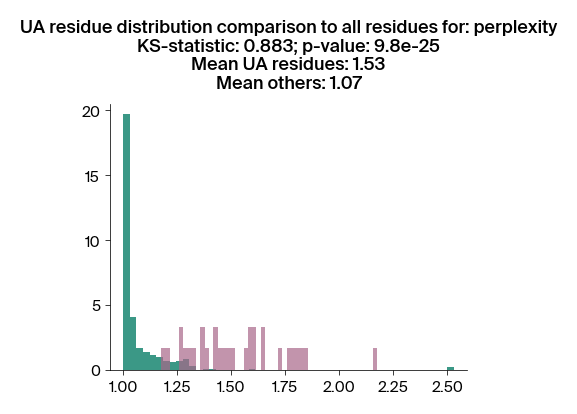

In [27]:
perplexity = pairwise_data[ModelName.M15000].groupby("position_i")["perplex_i"].first()

# Since the pairwise data is lower triangular (i.e. j > i), groups of position_i
# are missing perplexity values for the final residue, and groups of position_j
# are missing perplexity values for the first residue. We resolve by grouping by
# both and merging the results.
perplexity = perplexity.combine_first(
    pairwise_data[ModelName.M15000].groupby("position_j")["perplex_j"].first()
)

plot_distributions(perplexity[others], perplexity[ua_residues], "perplexity", bins=50)

The distribution of UA residues is pushed significantly towards residues of high perplexity. Residues with high perplexity correspond to model uncertainty, and the biological assumption here is that this position is therefore not highly conserved.

### Solvent Accessible Surface Area

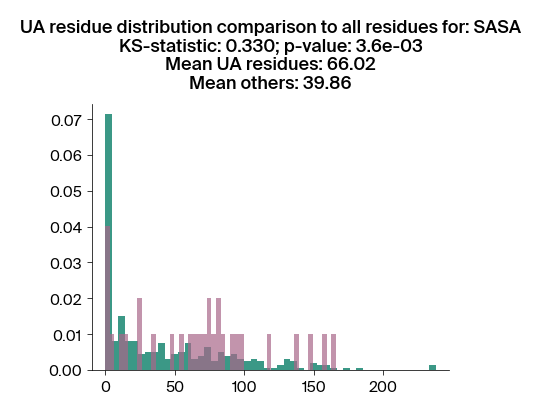

In [28]:
from biotite.structure.residues import apply_residue_wise
from biotite.structure.sasa import sasa


def calculate_sasa(path: Path):
    array = load_structure(path)
    atomic_sasa = sasa(array, vdw_radii="Single")
    solv_acc = apply_residue_wise(array, atomic_sasa, np.sum)
    return solv_acc


sasa_array = calculate_sasa("input/P00813.pdb")
plot_distributions(sasa_array[others], sasa_array[ua_residues], "SASA", 50)

The UA residues tend to be more exposed to solvent than the other residues.

### Distance to binding residues

For each residue we'll quantify its minimum distance (in 3D) to a residue implicated in binding. We'll measure from alpha-carbon to alpha-carbon. We already calculated all the pairwise residue distances when constructing the contact map, so we just need to identify the residues that are implicated as binding sites. UniProt contains this information (https://www.uniprot.org/uniprotkb/P00813/feature-viewer) and even provides an API for downloading a JSON with all the protein feature data... But this is just a quick and dirty analysis, so here are the 0-indexed residue positions implicated in binding, transcribed manually ¯\\\_(ツ)\_/¯:

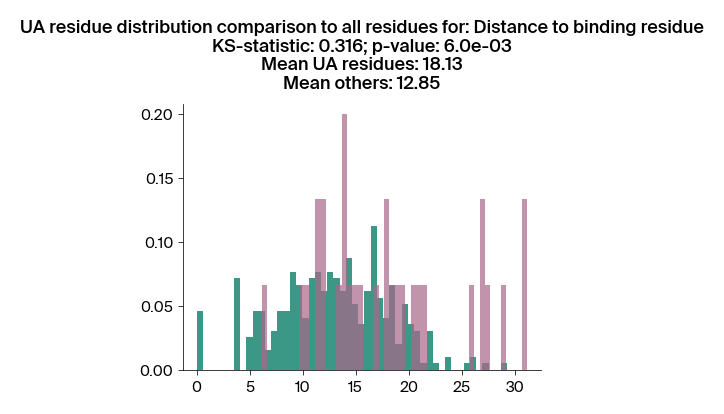

In [29]:
binding_residues = [14, 16, 18, 183, 213, 218, 237, 294, 295]
distance_to_binding_residues = distance_map[:, binding_residues].min(axis=1)

# Sanity check, min distance to self should be zero.
assert (distance_to_binding_residues[binding_residues] == 0).all()

plot_distributions(
    distance_to_binding_residues[others],
    distance_to_binding_residues[ua_residues],
    "Distance to binding residue",
    50,
)

UA residues distribute farther away from binding sites than other residues.

Taken altogether, the distribution of UA residues with respect to these three metrics indicate that they occur at residues of low conservation. Intuition would say that sites of low conservation should have little effect on the rest of the protein. Yet masking them unilaterally affects the distributions at other residues.

## Conclusion

The data seems to show that those residues--the ones which induce significant changes in the amino acid probability distributions of all other residues in the protein--are important in the following way: mutate them, and disproportionately alter the model's amino acid preferences at all the other positions. But these residues don't fit the profile for causing dramatic, across-protein consequences. In fact, the evidence suggests they tend to occur at residues exhibiting low conservation.

We are a bit "perplexed" by this result. For us, this exploration has left us with three questions.

1. Why does the contact map pattern diminish in the larger models?
2. Why do the larger models exhibit UA residues?
3. why do these UA residues tend to occur at sites of low conservation?

We're hoping this is where you come in. Do you know the answers to any of these questions, or have any hyotheses? We'd love to hear form you.